# DSGE-VAR

In [4]:
"""
Estimate a DSGE-VAR with simulation-based Bayesian priors and evaluate
its one-step-ahead forecast performance across different prior tightness
parameters (lambda).

Step 1: Load macro data and construct lagged regressors.
Step 2: Use simulated DSGE paths to compute prior second moments (gamma_xx, gamma_xy).
Step 3: For a grid of lambda values, estimate a Bayesian VAR with a rolling window
        and compute the mean absolute forecast error (MAE).
Step 4: Save the summary table to 'dsgevar.csv'.
"""

import numpy as np
import pandas as pd
import statsmodels.api as sm
from pathlib import Path
from Preprocess_data import get_lag  # extract_feature is not used in this cell

# --------------------------------------------------------------------------------------
# 1. Load real macro data and construct lagged variables
# --------------------------------------------------------------------------------------

DATA_PATH = Path("13个变量的targetdata.csv")
SIM_DIR = Path("./simulationcsv")

NUM_SIM_PATHS = 200    # number of simulated DSGE paths used to form priors
LAGS = 3               # VAR lag order
WINDOW_SIZE = 80       # rolling window length (T in the original code)

# Load raw data: one date column + 13 macro variables
df = pd.read_csv(DATA_PATH)

# Names of the macro series (drop the date column)
columns = df.columns.drop("date")
n_series = len(columns)

# Add lagged regressors for each macro series
df = get_lag(df, LAGS, columns)
df.set_index("date", inplace=True)

# --------------------------------------------------------------------------------------
# 2. Compute prior moments (gamma_xx, gamma_xy) from simulated DSGE data
#    These play the role of “pseudo-sample” sufficient statistics in a Bayesian VAR.
# --------------------------------------------------------------------------------------

gamma_xx = []  # list of X'X matrices from simulated data
gamma_xy = []  # list of X'Y matrices from simulated data

for sim_idx in range(NUM_SIM_PATHS):
    # Each file sim_data{1..200}.csv contains one simulated DSGE path
    sim_file = SIM_DIR / f"sim_data{sim_idx + 1}.csv"

    # In the original code, we keep the first 13 rows and columns 20:200, then transpose.
    # After transpose: shape (T_sim, n_series), i.e. time in rows, variables in columns.
    prior = (
        pd.read_csv(sim_file)
        .iloc[:n_series, 20:200]
        .T
    )

    # Build design matrix X for simulated data: constant + LAGS lagged values
    prior_X = pd.DataFrame(index=prior.index)
    prior_X = sm.add_constant(prior_X)  # add intercept

    for lag in range(LAGS):
        lagged = prior.shift(lag + 1)
        prior_X[[f"{name}{lag + 1}" for name in columns]] = lagged

    # Align Y with X (drop initial observations lost due to lags)
    prior_Y = prior.iloc[LAGS:]
    prior_X = prior_X.dropna()
    prior_Y = prior_Y.iloc[-len(prior_X):]

    X_sim = prior_X.to_numpy()
    Y_sim = prior_Y.to_numpy()

    gamma_xx.append(X_sim.T @ X_sim)   # X'X
    gamma_xy.append(X_sim.T @ Y_sim)   # X'Y

# Container for MAE at each lambda value
MAE = []

# --------------------------------------------------------------------------------------
# 3. Define the grid of lambda values (prior tightness parameters)
# --------------------------------------------------------------------------------------

lambda_grid_1 = np.linspace(0.1, 1.0, 10)   # finer grid near zero
lambda_grid_2 = np.linspace(2.0, 10.0, 9)   # larger values
final_array = np.concatenate((lambda_grid_1, lambda_grid_2))  # total 19 lambdas

# --------------------------------------------------------------------------------------
# 4. Rolling-window estimation and one-step-ahead forecasting for each lambda
# --------------------------------------------------------------------------------------

# Construct the real-data design matrix X and dependent variable Y once
X = pd.DataFrame(index=df.index)
X = sm.add_constant(X)

for lag in range(LAGS):
    X[[f"{name}{lag + 1}" for name in columns]] = df[[f"{name}{lag + 1}" for name in columns]]

# Y contains the current values of the 13 macro variables
Y = df.iloc[:, :n_series].copy()

T_total = len(df)
n_params = X.shape[1]        # 1 (constant) + LAGS * n_series
T_effective = WINDOW_SIZE    # scaling factor used with the prior (T = 80 in the original code)

for lam in final_array:
    # Collect one-step-ahead forecasts for the current lambda
    predicts = pd.DataFrame(columns=columns)

    # Rolling estimation window [i, i + WINDOW_SIZE)
    for i in range(T_total - WINDOW_SIZE):
        # Real sample used for posterior update
        real_x = X.iloc[i:i + WINDOW_SIZE].dropna()
        real_y = Y.iloc[i:i + WINDOW_SIZE]
        # Match Y to X after dropping NA in X
        real_y = real_y.iloc[-len(real_x):]

        X_real = real_x.to_numpy()
        Y_real = real_y.to_numpy()

        XX = X_real.T @ X_real   # X'X based on real data
        XY = X_real.T @ Y_real   # X'Y based on real data

        # Posterior mean of VAR coefficients, averaged across all simulated priors
        PHI_sum = np.zeros((n_params, n_series))

        for sim_idx in range(NUM_SIM_PATHS):
            prior_xx = gamma_xx[sim_idx]
            prior_xy = gamma_xy[sim_idx]

            # Bayesian update: combine prior (scaled by lam * T_effective) and real sample
            PHI = np.linalg.inv(lam * T_effective * prior_xx + XX) @ (
                lam * T_effective * prior_xy + XY
            )
            PHI_sum += PHI

        PHI_final = PHI_sum / NUM_SIM_PATHS  # (n_params x n_series)

        # One-step-ahead forecast at time i + WINDOW_SIZE
        x_next = X.iloc[i + WINDOW_SIZE].to_numpy()   # row vector (n_params,)
        y_pred = x_next @ PHI_final                   # (n_series,)

        # Append forecast as one new row
        predicts = pd.concat(
            [predicts, pd.DataFrame(y_pred, index=columns).T],
            ignore_index=True
        )

    # Compute variable-wise MAE for this lambda
    # Y.iloc[WINDOW_SIZE:] contains realized values at the forecast horizon
    mae = pd.DataFrame(
        np.abs(Y.iloc[WINDOW_SIZE:].to_numpy() - predicts.to_numpy()).mean(axis=0),
        index=columns
    ).T

    MAE.append(mae)

# --------------------------------------------------------------------------------------
# 5. Aggregate results across lambda and save summary table
# --------------------------------------------------------------------------------------

VAR_prior = pd.concat(MAE, ignore_index=True)
VAR_prior["lambda"] = final_array
VAR_prior.set_index("lambda", inplace=True)

# Standardize MAE by the unconditional std of each series (as in the original code)
std_y = Y.iloc[WINDOW_SIZE:][columns].std().values
VAR_prior["error"] = (VAR_prior[columns] / std_y).mean(axis=1)

# Save results for later analysis / plotting
VAR_prior.to_csv("dsgevar.csv")

VAR_prior  # display the summary table in the notebook

/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2243261095.py:147: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  predicts = pd.concat(
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2243261095.py:147: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  predicts = pd.concat(
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2243261095.py:147: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future v

,GDP,Hours_worked,Real_wage_growth,GDP_Deflator_Inflation,Core_PCE_Inflation,short_term_interest,Consumption_growth,Investment_growth,Spread,expected_inflation,long_term_interest,tfp,GDI,error
lambda,,,,,,,,,,,,,,
0.1,0.940914,0.856535,0.918304,0.354306,0.232291,0.516239,0.878281,1.384633,0.171788,0.039538,0.387382,1.046647,1.080836,0.757495
0.2,0.936140,0.821433,0.902584,0.406446,0.233398,0.602867,0.857059,1.374892,0.205279,0.040491,0.408642,1.024608,1.062774,0.797848
0.3,0.930375,0.799121,0.894932,0.447975,0.237406,0.651536,0.841676,1.373834,0.225644,0.041377,0.418391,1.010456,1.056860,0.823917
0.4,0.924569,0.781559,0.890379,0.483661,0.240140,0.684958,0.828826,1.377448,0.241440,0.042220,0.424339,1.000319,1.051821,0.843744
0.5,0.919209,0.766973,0.886831,0.517326,0.242348,0.710573,0.817680,1.383224,0.254154,0.043036,0.428479,0.992982,1.047920,0.860402
0.6,0.914179,0.757601,0.883958,0.546081,0.246908,0.731427,0.807882,1.388022,0.264536,0.043755,0.431603,0.987258,1.044968,0.874930
0.7,0.909264,0.749893,0.881570,0.570004,0.251991,0.751515,0.799174,1.392486,0.273152,0.044401,0.434083,0.983136,1.042218,0.887812
0.8,0.904665,0.742939,0.881118,0.590355,0.256228,0.772591,0.791362,1.397961,0.280331,0.044980,0.436120,0.979706,1.040831,0.899555
0.9,0.900356,0.736684,0.882533,0.607977,0.259930,0.791107,0.784299,1.403264,0.286426,0.045507,0.437833,0.976635,1.039808,0.909832


# ATGP

In [ ]:
"""
Transfer-learning macro forecasting using TGP (Transfer Gaussian Process).

For each macro variable y:
    1. Build a source-domain dataset from simulated DSGE data (prior).
       - For each simulated path, sample a small number of observations.
       - Stack all sampled observations into a single source dataset.
    2. Build a target-domain dataset from real macro data (first 80 periods).
    3. Train a TGP model on (source, target) jointly.
    4. Use the trained TGP to forecast y over the remaining periods.
    5. Record the Mean Absolute Error (MAE) of forecasts and the learned lambda.

Outputs:
    - mae_result: a DataFrame with MAE and lambda for each variable y
                  and each sample size in {1, ..., 7}.
"""

import autograd.numpy as np            # used inside TGP and for autograd-compatible ops
import sys
import toml
from util import *
from TGP import TGP
from get_dataset import *
import multiprocessing
import pickle
import matplotlib.pyplot as plt
import pandas as pd
import numpy as onp                     # standard NumPy for metrics / simple statistics
from Preprocess_data import extract_feature, get_lag

# ------------------------------------------------------------------------------------
# 1. Global configuration
# ------------------------------------------------------------------------------------

RAW_DATA_PATH = "13个变量的targetdata.csv"
SIM_DATA_DIR = "./simulationcsv"
SIM_FILE_TEMPLATE = SIM_DATA_DIR + "/sim_data{}.csv"

LAGS = 8                    # number of lags used as features (same for source & target)
TRAIN_WINDOW = 80           # length of target-domain training window (first 80 obs)
NUM_SIM_PATHS = 80          # number of simulated paths used to build priors
MIN_SAMPLE_SIZE = 1         # minimum number of sampled observations per sim path
MAX_SAMPLE_SIZE = 7         # maximum number of sampled observations per sim path

# ------------------------------------------------------------------------------------
# 2. Load real macro data and construct lagged design matrix
# ------------------------------------------------------------------------------------

# Raw data: one 'date' column + 13 macro variables
df = pd.read_csv(RAW_DATA_PATH)

# List of macro variable names (exclude the date column)
columns = df.columns.drop("date")
n_series = len(columns)

# Add lagged variables as regressors for each macro series
df = get_lag(df, LAGS, columns)
df.set_index("date", inplace=True)

# ------------------------------------------------------------------------------------
# 3. Pre-load simulated DSGE data (to avoid re-reading the same CSV files in loops)
# ------------------------------------------------------------------------------------

simulated_base = []

for t in range(NUM_SIM_PATHS):
    # Original code: .iloc[:13, 20:200].T
    # After transpose: (T_sim, n_series), i.e. time in rows, variables in columns
    sim_df = (
        pd.read_csv(SIM_FILE_TEMPLATE.format(t + 1))
        .iloc[:n_series, 20:200]
        .T
    )
    sim_df.columns = columns
    simulated_base.append(sim_df)

# ------------------------------------------------------------------------------------
# 4. Main loop: for each target variable y, and for each sample size
# ------------------------------------------------------------------------------------

# mae_result will store MAE and lambda for each variable y
mae_result = pd.DataFrame(columns=columns)

for y in columns:
    print(f"\n=== Processing target variable: {y} ===")
    mae_list = []      # MAE for each sample size (1..7) for this y
    lam_list = []      # corresponding lambda values returned by TGP

    # Vary the number of sampled observations per simulated path: 1, 2, ..., 7
    for sample_size in range(MIN_SAMPLE_SIZE, MAX_SAMPLE_SIZE + 1):
        print(f"\n--- Sample size per sim path: {sample_size} ---")

        # -------------------------------------------------------------------------
        # 4.1 Build source-domain dataset from simulated DSGE data
        # -------------------------------------------------------------------------
        sampled_prior_list = []

        for sim_df in simulated_base:
            # Copy and augment with LAGS lagged features
            prior_lagged = sim_df.copy()
            for lag in range(LAGS):
                prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
                    prior_lagged[columns].shift(lag + 1)

            # Drop rows with NaNs introduced by lagging
            prior_lagged = prior_lagged.dropna()

            # Randomly sample 'sample_size' observations from this simulated path
            # NOTE: random_state is fixed to make the sampling reproducible
            sampled = prior_lagged.sample(sample_size, random_state=2000)
            sampled_prior_list.append(sampled)

        # Stack all sampled observations across all simulated paths
        prior = pd.concat(sampled_prior_list, ignore_index=True)

        # Source-domain inputs (X) and outputs (y)
        # Here X consists of lagged variables; we transpose to match the TGP convention:
        # shape (n_features, n_points)
        src_x = prior.iloc[:, n_series:].values.T     # lag features
        src_y = prior[y].values.T                     # target variable series

        print(f"Source-domain sample size for {y}: {src_x.shape[1]}")

        # -------------------------------------------------------------------------
        # 4.2 Build target-domain dataset from real macro data (first TRAIN_WINDOW obs)
        # -------------------------------------------------------------------------
        target_df = df.iloc[:TRAIN_WINDOW, :]

        tag_x = target_df.iloc[:, n_series:].values.T   # lag features (target domain)
        tag_y = target_df[y].values.T                   # target variable

        # Pack into a dataset dictionary for TGP
        dataset = {
            "src_x": src_x,
            "src_y": src_y,
            "tag_x": tag_x,
            "tag_y": tag_y,
        }

        # -------------------------------------------------------------------------
        # 4.3 Train TGP model on (source, target) dataset
        # -------------------------------------------------------------------------
        model = TGP(dataset, bfgs_iter=200, debug=False)
        model.train()

        # -------------------------------------------------------------------------
        # 4.4 Prepare test set and generate forecasts
        # -------------------------------------------------------------------------
        pre_df = df.iloc[TRAIN_WINDOW:, :]              # out-of-sample period

        pre_x = pre_df.iloc[:, n_series:].values.T      # lag features
        real_y = pre_df[y].values.T                     # realized values of target y

        # Predictive mean and variance from TGP
        y_pred, y_var = model.predict(pre_x)

        # Optional: assemble a DataFrame with prediction details (for saving / plotting)
        result = pd.DataFrame({
            "date": pre_df.index.tolist(),
            "y_pre": y_pred,
            "y_var": y_var,
            "y_real": real_y,
        })
        # Example for saving:
        # result.to_csv(f"./预测结果/sample{sample_size}_{y}_lag{LAGS}.csv", index=False)

        # -------------------------------------------------------------------------
        # 4.5 Compute MAE on the test set and record lambda
        # -------------------------------------------------------------------------
        mae = onp.mean(onp.abs(y_pred - real_y))
        mae_list.append(mae)

        print(f"Mean Absolute Error for {y}, sample_size={sample_size}: {mae:.6f}")

        # Store the learned transfer strength (lambda) from TGP
        lam = model.return_lambda()
        lam_list.append(lam)
        print(f"Estimated lambda for {y}, sample_size={sample_size}: {lam}")

    # After looping over all sample sizes for this y, store results
    mae_result[y] = mae_list
    mae_result[f"{y}_lambda"] = lam_list

# At this point, mae_result has:
#   - For each variable y: 7 rows (sample_size = 1..7) × 2 columns (MAE and lambda)


/Users/douyun/Desktop/科研项目/Transfer Learning Adaptive GP/Code/Coding_sample_YunDou/Preprocess_data.py:15: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_processed[[co+str(lag+1) for co in columns]] =  ini_df[columns].shift(lag+1)
/Users/douyun/Desktop/科研项目/Transfer Learning Adaptive GP/Code/Coding_sample_YunDou/Preprocess_data.py:15: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_processed[[co+str(lag+1) for co in columns]] =  ini_df[columns].shift(lag+1)
/Users/douyun/Desktop/科研项目/Transfer Learning Adaptive GP/Code/Coding_s


=== Processing target variable: GDP ===

--- Sample size per sim path: 1 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for GDP: 80
Initial lambda:  -0.593064862314306


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/tracer.py:54: RuntimeWarning: overflow encountered in exp
  return f_raw(*args, **kwargs)
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:160: RuntimeWarning: invalid value encountered in multiply
  defvjp(anp.exp, lambda ans, x: lambda g: ans * g)
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var

TGP. Exception caught, L-BFGS early stopping...
TGP. TGP model training process finished
Optimized lambda:  -0.5753083966113023
Mean Absolute Error for GDP, sample_size=1: 0.897555
Estimated lambda for GDP, sample_size=1: -0.5753083966113023

--- Sample size per sim path: 2 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for GDP: 160
Initial lambda:  0.12868935070891352


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),


TGP. TGP model training process finished
Optimized lambda:  0.8623672622369082
Mean Absolute Error for GDP, sample_size=2: 0.936332
Estimated lambda for GDP, sample_size=2: 0.8623672622369082

--- Sample size per sim path: 3 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for GDP: 240
Initial lambda:  -0.31006624440345343
TGP. TGP model training process finished
Optimized lambda:  0.9782079583044642
Mean Absolute Error for GDP, sample_size=3: 1.021002
Estimated lambda for GDP, sample_size=3: 0.9782079583044642

--- Sample size per sim path: 4 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for GDP: 320
Initial lambda:  -0.510591967476479


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/tracer.py:54: RuntimeWarning: overflow encountered in exp
  return f_raw(*args, **kwargs)
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:160: RuntimeWarning: invalid value encountered in multiply
  defvjp(anp.exp, lambda ans, x: lambda g: ans * g)


TGP. Exception caught, L-BFGS early stopping...
TGP. TGP model training process finished
Optimized lambda:  -0.011335304837423565
Mean Absolute Error for GDP, sample_size=4: 1.026649
Estimated lambda for GDP, sample_size=4: -0.011335304837423565

--- Sample size per sim path: 5 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for GDP: 400
Initial lambda:  -0.4802085308148565


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),


TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for GDP, sample_size=5: 1.662908
Estimated lambda for GDP, sample_size=5: 1.0

--- Sample size per sim path: 6 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for GDP: 480
Initial lambda:  -0.5947937468888325
TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for GDP, sample_size=6: 0.973482
Estimated lambda for GDP, sample_size=6: 1.0

--- Sample size per sim path: 7 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for GDP: 560
Initial lambda:  -0.06814853751574068
TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for GDP, sample_size=7: 1.263341
Estimated lambda for GDP, sample_size=7: 1.0

=== Processing target variable: Hours_worked ===

--- Sample size per sim path: 1 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Hours_worked: 80
Initial lambda:  -0.8430799731613996
TGP. TGP model training process finished
Optimized lambda:  -1.0
Mean Absolute Error for Hours_worked, sample_size=1: 0.715288
Estimated lambda for Hours_worked, sample_size=1: -1.0

--- Sample size per sim path: 2 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Hours_worked: 160
Initial lambda:  -0.7003911956595401


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/tracer.py:54: RuntimeWarning: overflow encountered in exp
  return f_raw(*args, **kwargs)


TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for Hours_worked, sample_size=2: 0.634252
Estimated lambda for Hours_worked, sample_size=2: 1.0

--- Sample size per sim path: 3 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Hours_worked: 240
Initial lambda:  -0.9618018175763023


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/tracer.py:54: RuntimeWarning: overflow encountered in exp
  return f_raw(*args, **kwargs)


TGP. TGP model training process finished
Optimized lambda:  0.9998917348151712
Mean Absolute Error for Hours_worked, sample_size=3: 0.656700
Estimated lambda for Hours_worked, sample_size=3: 0.9998917348151712

--- Sample size per sim path: 4 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Hours_worked: 320
Initial lambda:  0.006450981513142828


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/tracer.py:54: RuntimeWarning: overflow encountered in exp
  return f_raw(*args, **kwargs)


TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for Hours_worked, sample_size=4: 0.627834
Estimated lambda for Hours_worked, sample_size=4: 1.0

--- Sample size per sim path: 5 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Hours_worked: 400
Initial lambda:  0.964572820672589
TGP. TGP model training process finished
Optimized lambda:  0.9971810929338997
Mean Absolute Error for Hours_worked, sample_size=5: 0.711648
Estimated lambda for Hours_worked, sample_size=5: 0.9971810929338997

--- Sample size per sim path: 6 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Hours_worked: 480
Initial lambda:  -0.8097391554023856
TGP. TGP model training process finished
Optimized lambda:  0.9999988980440405
Mean Absolute Error for Hours_worked, sample_size=6: 0.855301
Estimated lambda for Hours_worked, sample_size=6: 0.9999988980440405

--- Sample size per sim path: 7 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Hours_worked: 560
Initial lambda:  0.6782247068004432


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/tracer.py:54: RuntimeWarning: overflow encountered in exp
  return f_raw(*args, **kwargs)
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:160: RuntimeWarning: invalid value encountered in multiply
  defvjp(anp.exp, lambda ans, x: lambda g: ans * g)


TGP. TGP model training process finished
Optimized lambda:  0.999705472299156
Mean Absolute Error for Hours_worked, sample_size=7: 0.811567
Estimated lambda for Hours_worked, sample_size=7: 0.999705472299156

=== Processing target variable: Real_wage_growth ===

--- Sample size per sim path: 1 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Real_wage_growth: 80
Initial lambda:  0.4231795716316167


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/tracer.py:54: RuntimeWarning: overflow encountered in exp
  return f_raw(*args, **kwargs)
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:160: RuntimeWarning: invalid value encountered in multiply
  defvjp(anp.exp, lambda ans, x: lambda g: ans * g)
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var

TGP. TGP model training process finished
Optimized lambda:  -1.0
Mean Absolute Error for Real_wage_growth, sample_size=1: 0.967441
Estimated lambda for Real_wage_growth, sample_size=1: -1.0

--- Sample size per sim path: 2 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Real_wage_growth: 160
Initial lambda:  -0.378327493220443


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/tracer.py:54: RuntimeWarning: overflow encountered in exp
  return f_raw(*args, **kwargs)
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:160: RuntimeWarning: invalid value encountered in multiply
  defvjp(anp.exp, lambda ans, x: lambda g: ans * g)


TGP. Exception caught, L-BFGS early stopping...
TGP. TGP model training process finished
Optimized lambda:  -0.7094960979120918
Mean Absolute Error for Real_wage_growth, sample_size=2: 0.915091
Estimated lambda for Real_wage_growth, sample_size=2: -0.7094960979120918

--- Sample size per sim path: 3 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Real_wage_growth: 240
Initial lambda:  -0.490111823560049


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),


TGP. TGP model training process finished
Optimized lambda:  -0.9992368121982549
Mean Absolute Error for Real_wage_growth, sample_size=3: 1.007789
Estimated lambda for Real_wage_growth, sample_size=3: -0.9992368121982549

--- Sample size per sim path: 4 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Real_wage_growth: 320
Initial lambda:  -0.2926851241529491


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),


TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for Real_wage_growth, sample_size=4: 0.987555
Estimated lambda for Real_wage_growth, sample_size=4: 1.0

--- Sample size per sim path: 5 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Real_wage_growth: 400
Initial lambda:  -0.6298250948062305


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/tracer.py:54: RuntimeWarning: overflow encountered in exp
  return f_raw(*args, **kwargs)
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:160: RuntimeWarning: invalid value encountered in multiply
  defvjp(anp.exp, lambda ans, x: lambda g: ans * g)


TGP. TGP model training process finished
Optimized lambda:  0.25008885432742867
Mean Absolute Error for Real_wage_growth, sample_size=5: 0.953366
Estimated lambda for Real_wage_growth, sample_size=5: 0.25008885432742867

--- Sample size per sim path: 6 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Real_wage_growth: 480
Initial lambda:  0.7736983569541338
TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for Real_wage_growth, sample_size=6: 1.196592
Estimated lambda for Real_wage_growth, sample_size=6: 1.0

--- Sample size per sim path: 7 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Real_wage_growth: 560
Initial lambda:  -0.5201741917963625
TGP. TGP model training process finished
Optimized lambda:  -1.0
Mean Absolute Error for Real_wage_growth, sample_size=7: 0.950669
Estimated lambda for Real_wage_growth, sample_size=7: -1.0

=== Processing target variable: GDP_Deflator_Inflation ===

--- Sample size per sim path: 1 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for GDP_Deflator_Inflation: 80
Initial lambda:  0.6592229760852666
TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for GDP_Deflator_Inflation, sample_size=1: 0.267787
Estimated lambda for GDP_Deflator_Inflation, sample_size=1: 1.0

--- Sample size per sim path: 2 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for GDP_Deflator_Inflation: 160
Initial lambda:  -0.8287332747530336
TGP. TGP model training process finished
Optimized lambda:  -1.0
Mean Absolute Error for GDP_Deflator_Inflation, sample_size=2: 0.297727
Estimated lambda for GDP_Deflator_Inflation, sample_size=2: -1.0

--- Sample size per sim path: 3 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for GDP_Deflator_Inflation: 240
Initial lambda:  0.6520127481223825
TGP. TGP model training process finished
Optimized lambda:  0.651971588359783
Mean Absolute Error for GDP_Deflator_Inflation, sample_size=3: 0.414350
Estimated lambda for GDP_Deflator_Inflation, sample_size=3: 0.651971588359783

--- Sample size per sim path: 4 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for GDP_Deflator_Inflation: 320
Initial lambda:  -0.698030623149082
TGP. TGP model training process finished
Optimized lambda:  -0.7545551771867035
Mean Absolute Error for GDP_Deflator_Inflation, sample_size=4: 0.402000
Estimated lambda for GDP_Deflator_Inflation, sample_size=4: -0.7545551771867035

--- Sample size per sim path: 5 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for GDP_Deflator_Inflation: 400
Initial lambda:  -0.5183147613121903
TGP. TGP model training process finished
Optimized lambda:  -0.39373730261647344
Mean Absolute Error for GDP_Deflator_Inflation, sample_size=5: 0.461761
Estimated lambda for GDP_Deflator_Inflation, sample_size=5: -0.39373730261647344

--- Sample size per sim path: 6 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for GDP_Deflator_Inflation: 480
Initial lambda:  0.06417242083442853
TGP. TGP model training process finished
Optimized lambda:  0.3430826275840433
Mean Absolute Error for GDP_Deflator_Inflation, sample_size=6: 0.447949
Estimated lambda for GDP_Deflator_Inflation, sample_size=6: 0.3430826275840433

--- Sample size per sim path: 7 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for GDP_Deflator_Inflation: 560
Initial lambda:  -0.6209297685473611
TGP. TGP model training process finished
Optimized lambda:  -0.5504274615926308
Mean Absolute Error for GDP_Deflator_Inflation, sample_size=7: 0.449289
Estimated lambda for GDP_Deflator_Inflation, sample_size=7: -0.5504274615926308

=== Processing target variable: Core_PCE_Inflation ===

--- Sample size per sim path: 1 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Core_PCE_Inflation: 80
Initial lambda:  0.4550230922869196
TGP. TGP model training process finished
Optimized lambda:  0.4501266788886531
Mean Absolute Error for Core_PCE_Inflation, sample_size=1: 0.269958
Estimated lambda for Core_PCE_Inflation, sample_size=1: 0.4501266788886531

--- Sample size per sim path: 2 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Core_PCE_Inflation: 160
Initial lambda:  0.4788124624645822
TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for Core_PCE_Inflation, sample_size=2: 0.421042
Estimated lambda for Core_PCE_Inflation, sample_size=2: 1.0

--- Sample size per sim path: 3 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Core_PCE_Inflation: 240
Initial lambda:  -0.924436267834438


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/tracer.py:54: RuntimeWarning: overflow encountered in exp
  return f_raw(*args, **kwargs)
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:160: RuntimeWarning: invalid value encountered in multiply
  defvjp(anp.exp, lambda ans, x: lambda g: ans * g)


TGP. Exception caught, L-BFGS early stopping...
TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for Core_PCE_Inflation, sample_size=3: 0.463654
Estimated lambda for Core_PCE_Inflation, sample_size=3: 1.0

--- Sample size per sim path: 4 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Core_PCE_Inflation: 320
Initial lambda:  0.6231502151373851
TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for Core_PCE_Inflation, sample_size=4: 0.363197
Estimated lambda for Core_PCE_Inflation, sample_size=4: 1.0

--- Sample size per sim path: 5 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Core_PCE_Inflation: 400
Initial lambda:  0.055590620240780986


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/tracer.py:54: RuntimeWarning: overflow encountered in exp
  return f_raw(*args, **kwargs)
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:160: RuntimeWarning: invalid value encountered in multiply
  defvjp(anp.exp, lambda ans, x: lambda g: ans * g)


TGP. Exception caught, L-BFGS early stopping...
TGP. TGP model training process finished
Optimized lambda:  -1.0
Mean Absolute Error for Core_PCE_Inflation, sample_size=5: 0.266874
Estimated lambda for Core_PCE_Inflation, sample_size=5: -1.0

--- Sample size per sim path: 6 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Core_PCE_Inflation: 480
Initial lambda:  -0.3707882256929391
TGP. TGP model training process finished
Optimized lambda:  -0.99100354549416
Mean Absolute Error for Core_PCE_Inflation, sample_size=6: 0.267386
Estimated lambda for Core_PCE_Inflation, sample_size=6: -0.99100354549416

--- Sample size per sim path: 7 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Core_PCE_Inflation: 560
Initial lambda:  0.09050073243371037
TGP. TGP model training process finished
Optimized lambda:  -0.3820368401271996
Mean Absolute Error for Core_PCE_Inflation, sample_size=7: 0.277498
Estimated lambda for Core_PCE_Inflation, sample_size=7: -0.3820368401271996

=== Processing target variable: short_term_interest ===

--- Sample size per sim path: 1 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for short_term_interest: 80
Initial lambda:  0.7463663464830308
TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for short_term_interest, sample_size=1: 0.845217
Estimated lambda for short_term_interest, sample_size=1: 1.0

--- Sample size per sim path: 2 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for short_term_interest: 160
Initial lambda:  0.6778090101269858
TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for short_term_interest, sample_size=2: 0.225675
Estimated lambda for short_term_interest, sample_size=2: 1.0

--- Sample size per sim path: 3 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for short_term_interest: 240
Initial lambda:  -0.3080460853436422
TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for short_term_interest, sample_size=3: 0.157378
Estimated lambda for short_term_interest, sample_size=3: 1.0

--- Sample size per sim path: 4 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for short_term_interest: 320
Initial lambda:  0.9207757225840532
TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for short_term_interest, sample_size=4: 0.168710
Estimated lambda for short_term_interest, sample_size=4: 1.0

--- Sample size per sim path: 5 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for short_term_interest: 400
Initial lambda:  -0.011130392341451412
TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for short_term_interest, sample_size=5: 0.173187
Estimated lambda for short_term_interest, sample_size=5: 1.0

--- Sample size per sim path: 6 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for short_term_interest: 480
Initial lambda:  -0.8068701812996377
TGP. TGP model training process finished
Optimized lambda:  0.9744073010150137
Mean Absolute Error for short_term_interest, sample_size=6: 0.298755
Estimated lambda for short_term_interest, sample_size=6: 0.9744073010150137

--- Sample size per sim path: 7 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for short_term_interest: 560
Initial lambda:  0.06738186913799504
TGP. TGP model training process finished
Optimized lambda:  0.9430200024845429
Mean Absolute Error for short_term_interest, sample_size=7: 0.456373
Estimated lambda for short_term_interest, sample_size=7: 0.9430200024845429

=== Processing target variable: Consumption_growth ===

--- Sample size per sim path: 1 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Consumption_growth: 80
Initial lambda:  -0.10096996643422096


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/tracer.py:54: RuntimeWarning: overflow encountered in exp
  return f_raw(*args, **kwargs)
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:160: RuntimeWarning: invalid value encountered in multiply
  defvjp(anp.exp, lambda ans, x: lambda g: ans * g)
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var

TGP. Exception caught, L-BFGS early stopping...
TGP. TGP model training process finished
Optimized lambda:  -0.10571327511757889
Mean Absolute Error for Consumption_growth, sample_size=1: 0.730405
Estimated lambda for Consumption_growth, sample_size=1: -0.10571327511757889

--- Sample size per sim path: 2 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Consumption_growth: 160
Initial lambda:  0.04634475816173844


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/tracer.py:54: RuntimeWarning: overflow encountered in exp
  return f_raw(*args, **kwargs)
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:160: RuntimeWarning: invalid value encountered in multiply
  defvjp(anp.exp, lambda ans, x: lambda g: ans * g)


TGP. Exception caught, L-BFGS early stopping...
TGP. TGP model training process finished
Optimized lambda:  0.01342243568307081
Mean Absolute Error for Consumption_growth, sample_size=2: 0.768916
Estimated lambda for Consumption_growth, sample_size=2: 0.01342243568307081

--- Sample size per sim path: 3 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Consumption_growth: 240
Initial lambda:  0.9354224576149726
TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for Consumption_growth, sample_size=3: 0.732252
Estimated lambda for Consumption_growth, sample_size=3: 1.0

--- Sample size per sim path: 4 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Consumption_growth: 320
Initial lambda:  -0.9649250873457063


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/tracer.py:54: RuntimeWarning: overflow encountered in exp
  return f_raw(*args, **kwargs)
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:160: RuntimeWarning: invalid value encountered in multiply
  defvjp(anp.exp, lambda ans, x: lambda g: ans * g)


TGP. TGP model training process finished
Optimized lambda:  -0.15488882373011192
Mean Absolute Error for Consumption_growth, sample_size=4: 0.631211
Estimated lambda for Consumption_growth, sample_size=4: -0.15488882373011192

--- Sample size per sim path: 5 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Consumption_growth: 400
Initial lambda:  -0.8182433027946436


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/tracer.py:54: RuntimeWarning: overflow encountered in exp
  return f_raw(*args, **kwargs)
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:160: RuntimeWarning: invalid value encountered in multiply
  defvjp(anp.exp, lambda ans, x: lambda g: ans * g)


TGP. Exception caught, L-BFGS early stopping...
TGP. TGP model training process finished
Optimized lambda:  -0.677211946638349
Mean Absolute Error for Consumption_growth, sample_size=5: 0.660289
Estimated lambda for Consumption_growth, sample_size=5: -0.677211946638349

--- Sample size per sim path: 6 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Consumption_growth: 480
Initial lambda:  0.9392932827513092


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/tracer.py:54: RuntimeWarning: overflow encountered in exp
  return f_raw(*args, **kwargs)
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:160: RuntimeWarning: invalid value encountered in multiply
  defvjp(anp.exp, lambda ans, x: lambda g: ans * g)


TGP. TGP model training process finished
Optimized lambda:  0.8105089222641791
Mean Absolute Error for Consumption_growth, sample_size=6: 0.706334
Estimated lambda for Consumption_growth, sample_size=6: 0.8105089222641791

--- Sample size per sim path: 7 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Consumption_growth: 560
Initial lambda:  -0.8888483721853251
TGP. TGP model training process finished
Optimized lambda:  -0.8329633437391813
Mean Absolute Error for Consumption_growth, sample_size=7: 0.707579
Estimated lambda for Consumption_growth, sample_size=7: -0.8329633437391813

=== Processing target variable: Investment_growth ===

--- Sample size per sim path: 1 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Investment_growth: 80
Initial lambda:  -0.20055360759184615
TGP. TGP model training process finished
Optimized lambda:  -0.20090151121032346
Mean Absolute Error for Investment_growth, sample_size=1: 1.776155
Estimated lambda for Investment_growth, sample_size=1: -0.20090151121032346

--- Sample size per sim path: 2 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Investment_growth: 160
Initial lambda:  -0.890579116307139
TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for Investment_growth, sample_size=2: 1.441752
Estimated lambda for Investment_growth, sample_size=2: 1.0

--- Sample size per sim path: 3 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Investment_growth: 240
Initial lambda:  0.45004796329504293


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),


TGP. TGP model training process finished
Optimized lambda:  0.4639447228202332
Mean Absolute Error for Investment_growth, sample_size=3: 1.731341
Estimated lambda for Investment_growth, sample_size=3: 0.4639447228202332

--- Sample size per sim path: 4 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Investment_growth: 320
Initial lambda:  0.27099835169884834


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),


TGP. TGP model training process finished
Optimized lambda:  -1.0
Mean Absolute Error for Investment_growth, sample_size=4: 1.767692
Estimated lambda for Investment_growth, sample_size=4: -1.0

--- Sample size per sim path: 5 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Investment_growth: 400
Initial lambda:  -0.09297534860051582
TGP. TGP model training process finished
Optimized lambda:  -0.06091048077570615
Mean Absolute Error for Investment_growth, sample_size=5: 2.280722
Estimated lambda for Investment_growth, sample_size=5: -0.06091048077570615

--- Sample size per sim path: 6 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Investment_growth: 480
Initial lambda:  -0.1505780307745852


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),


TGP. TGP model training process finished
Optimized lambda:  -1.0
Mean Absolute Error for Investment_growth, sample_size=6: 2.335956
Estimated lambda for Investment_growth, sample_size=6: -1.0

--- Sample size per sim path: 7 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Investment_growth: 560
Initial lambda:  0.6178155224246957
TGP. TGP model training process finished
Optimized lambda:  -1.0
Mean Absolute Error for Investment_growth, sample_size=7: 2.551083
Estimated lambda for Investment_growth, sample_size=7: -1.0

=== Processing target variable: Spread ===

--- Sample size per sim path: 1 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Spread: 80
Initial lambda:  0.07951218933841431
TGP. TGP model training process finished
Optimized lambda:  -0.06844550089677907
Mean Absolute Error for Spread, sample_size=1: 0.112995
Estimated lambda for Spread, sample_size=1: -0.06844550089677907

--- Sample size per sim path: 2 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Spread: 160
Initial lambda:  0.7416272683371052
TGP. TGP model training process finished
Optimized lambda:  -1.0
Mean Absolute Error for Spread, sample_size=2: 0.118771
Estimated lambda for Spread, sample_size=2: -1.0

--- Sample size per sim path: 3 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Spread: 240
Initial lambda:  -0.3151516550936184


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/tracer.py:54: RuntimeWarning: overflow encountered in exp
  return f_raw(*args, **kwargs)
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:160: RuntimeWarning: invalid value encountered in multiply
  defvjp(anp.exp, lambda ans, x: lambda g: ans * g)


TGP. Exception caught, L-BFGS early stopping...
TGP. TGP model training process finished
Optimized lambda:  -1.0
Mean Absolute Error for Spread, sample_size=3: 0.120309
Estimated lambda for Spread, sample_size=3: -1.0

--- Sample size per sim path: 4 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Spread: 320
Initial lambda:  0.6335655904680035
TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for Spread, sample_size=4: 0.089500
Estimated lambda for Spread, sample_size=4: 1.0

--- Sample size per sim path: 5 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Spread: 400
Initial lambda:  -0.2661268037386273


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/tracer.py:54: RuntimeWarning: overflow encountered in exp
  return f_raw(*args, **kwargs)
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:160: RuntimeWarning: invalid value encountered in multiply
  defvjp(anp.exp, lambda ans, x: lambda g: ans * g)


TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for Spread, sample_size=5: 0.084610
Estimated lambda for Spread, sample_size=5: 1.0

--- Sample size per sim path: 6 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Spread: 480
Initial lambda:  -0.1677186534328412
TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for Spread, sample_size=6: 0.082952
Estimated lambda for Spread, sample_size=6: 1.0

--- Sample size per sim path: 7 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for Spread: 560
Initial lambda:  -0.4081220065710065
TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for Spread, sample_size=7: 0.080240
Estimated lambda for Spread, sample_size=7: 1.0

=== Processing target variable: expected_inflation ===

--- Sample size per sim path: 1 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for expected_inflation: 80
Initial lambda:  0.10304300476641837
TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for expected_inflation, sample_size=1: 0.175607
Estimated lambda for expected_inflation, sample_size=1: 1.0

--- Sample size per sim path: 2 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for expected_inflation: 160
Initial lambda:  0.7158019271014266
TGP. TGP model training process finished
Optimized lambda:  0.9336983871837561
Mean Absolute Error for expected_inflation, sample_size=2: 0.140850
Estimated lambda for expected_inflation, sample_size=2: 0.9336983871837561

--- Sample size per sim path: 3 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for expected_inflation: 240
Initial lambda:  -0.8080715870754651
TGP. TGP model training process finished
Optimized lambda:  -0.33876865931767286
Mean Absolute Error for expected_inflation, sample_size=3: 0.093824
Estimated lambda for expected_inflation, sample_size=3: -0.33876865931767286

--- Sample size per sim path: 4 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for expected_inflation: 320
Initial lambda:  0.6078300705063351
TGP. TGP model training process finished
Optimized lambda:  0.9371860527656528
Mean Absolute Error for expected_inflation, sample_size=4: 0.084598
Estimated lambda for expected_inflation, sample_size=4: 0.9371860527656528

--- Sample size per sim path: 5 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for expected_inflation: 400
Initial lambda:  0.21915837438142427
TGP. TGP model training process finished
Optimized lambda:  0.9993373911711313
Mean Absolute Error for expected_inflation, sample_size=5: 0.104683
Estimated lambda for expected_inflation, sample_size=5: 0.9993373911711313

--- Sample size per sim path: 6 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for expected_inflation: 480
Initial lambda:  -0.47935696202826716
TGP. TGP model training process finished
Optimized lambda:  -0.999670762173234
Mean Absolute Error for expected_inflation, sample_size=6: 0.102346
Estimated lambda for expected_inflation, sample_size=6: -0.999670762173234

--- Sample size per sim path: 7 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for expected_inflation: 560
Initial lambda:  0.9268371192793532
TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for expected_inflation, sample_size=7: 0.047618
Estimated lambda for expected_inflation, sample_size=7: 1.0

=== Processing target variable: long_term_interest ===

--- Sample size per sim path: 1 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for long_term_interest: 80
Initial lambda:  -0.26032424027093315
TGP. TGP model training process finished
Optimized lambda:  -0.2597083613321522
Mean Absolute Error for long_term_interest, sample_size=1: 0.399953
Estimated lambda for long_term_interest, sample_size=1: -0.2597083613321522

--- Sample size per sim path: 2 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for long_term_interest: 160
Initial lambda:  -0.023883182050797203
TGP. TGP model training process finished
Optimized lambda:  -0.014452095208546682
Mean Absolute Error for long_term_interest, sample_size=2: 0.587332
Estimated lambda for long_term_interest, sample_size=2: -0.014452095208546682

--- Sample size per sim path: 3 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for long_term_interest: 240
Initial lambda:  -0.03629162286157461
TGP. TGP model training process finished
Optimized lambda:  -0.035217634534359554
Mean Absolute Error for long_term_interest, sample_size=3: 0.434350
Estimated lambda for long_term_interest, sample_size=3: -0.035217634534359554

--- Sample size per sim path: 4 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for long_term_interest: 320
Initial lambda:  -0.3507804920007387
TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for long_term_interest, sample_size=4: 0.310991
Estimated lambda for long_term_interest, sample_size=4: 1.0

--- Sample size per sim path: 5 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for long_term_interest: 400
Initial lambda:  -0.4350305312678293
TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for long_term_interest, sample_size=5: 0.260313
Estimated lambda for long_term_interest, sample_size=5: 1.0

--- Sample size per sim path: 6 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for long_term_interest: 480
Initial lambda:  0.35615896151826987
TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for long_term_interest, sample_size=6: 0.251920
Estimated lambda for long_term_interest, sample_size=6: 1.0

--- Sample size per sim path: 7 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for long_term_interest: 560
Initial lambda:  -0.49697306869207836
TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for long_term_interest, sample_size=7: 0.236648
Estimated lambda for long_term_interest, sample_size=7: 1.0

=== Processing target variable: tfp ===

--- Sample size per sim path: 1 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for tfp: 80
Initial lambda:  -0.7908390633260391


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/tracer.py:54: RuntimeWarning: overflow encountered in exp
  return f_raw(*args, **kwargs)
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:160: RuntimeWarning: invalid value encountered in multiply
  defvjp(anp.exp, lambda ans, x: lambda g: ans * g)
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var

TGP. Exception caught, L-BFGS early stopping...
TGP. TGP model training process finished
Optimized lambda:  -0.04922546941999617
Mean Absolute Error for tfp, sample_size=1: 1.035765
Estimated lambda for tfp, sample_size=1: -0.04922546941999617

--- Sample size per sim path: 2 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for tfp: 160
Initial lambda:  0.7602716589067269


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/tracer.py:54: RuntimeWarning: overflow encountered in exp
  return f_raw(*args, **kwargs)
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:160: RuntimeWarning: invalid value encountered in multiply
  defvjp(anp.exp, lambda ans, x: lambda g: ans * g)


TGP. TGP model training process finished
Optimized lambda:  0.9368928303895295
Mean Absolute Error for tfp, sample_size=2: 1.037360
Estimated lambda for tfp, sample_size=2: 0.9368928303895295

--- Sample size per sim path: 3 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for tfp: 240
Initial lambda:  -0.41766012886758763
TGP. TGP model training process finished
Optimized lambda:  -0.8231916303509121
Mean Absolute Error for tfp, sample_size=3: 1.151027
Estimated lambda for tfp, sample_size=3: -0.8231916303509121

--- Sample size per sim path: 4 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for tfp: 320
Initial lambda:  -0.3321673113903483


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/tracer.py:54: RuntimeWarning: overflow encountered in exp
  return f_raw(*args, **kwargs)
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:160: RuntimeWarning: invalid value encountered in multiply
  defvjp(anp.exp, lambda ans, x: lambda g: ans * g)


TGP. TGP model training process finished
Optimized lambda:  1.0
Mean Absolute Error for tfp, sample_size=4: 1.130262
Estimated lambda for tfp, sample_size=4: 1.0

--- Sample size per sim path: 5 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for tfp: 400
Initial lambda:  -0.9333351590388226
TGP. TGP model training process finished
Optimized lambda:  -0.8993831758316057
Mean Absolute Error for tfp, sample_size=5: 0.950931
Estimated lambda for tfp, sample_size=5: -0.8993831758316057

--- Sample size per sim path: 6 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for tfp: 480
Initial lambda:  -0.664336196662292
TGP. TGP model training process finished
Optimized lambda:  -0.5811401185060932
Mean Absolute Error for tfp, sample_size=6: 0.950465
Estimated lambda for tfp, sample_size=6: -0.5811401185060932

--- Sample size per sim path: 7 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for tfp: 560
Initial lambda:  -0.9460781953662882


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/tracer.py:54: RuntimeWarning: overflow encountered in exp
  return f_raw(*args, **kwargs)
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:160: RuntimeWarning: invalid value encountered in multiply
  defvjp(anp.exp, lambda ans, x: lambda g: ans * g)


TGP. Exception caught, L-BFGS early stopping...
TGP. TGP model training process finished
Optimized lambda:  -0.8940272327545855
Mean Absolute Error for tfp, sample_size=7: 1.179620
Estimated lambda for tfp, sample_size=7: -0.8940272327545855

=== Processing target variable: GDI ===

--- Sample size per sim path: 1 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for GDI: 80
Initial lambda:  -0.8964548796870038


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/tracer.py:54: RuntimeWarning: overflow encountered in exp
  return f_raw(*args, **kwargs)
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:160: RuntimeWarning: invalid value encountered in multiply
  defvjp(anp.exp, lambda ans, x: lambda g: ans * g)
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var

TGP. TGP model training process finished
Optimized lambda:  -0.8964784658535574
Mean Absolute Error for GDI, sample_size=1: 0.847706
Estimated lambda for GDI, sample_size=1: -0.8964784658535574

--- Sample size per sim path: 2 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for GDI: 160
Initial lambda:  -0.8355612516009727
TGP. TGP model training process finished
Optimized lambda:  -0.8344803398863694
Mean Absolute Error for GDI, sample_size=2: 0.874998
Estimated lambda for GDI, sample_size=2: -0.8344803398863694

--- Sample size per sim path: 3 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for GDI: 240
Initial lambda:  -0.4361951654546812
TGP. TGP model training process finished
Optimized lambda:  -0.4340017348332203
Mean Absolute Error for GDI, sample_size=3: 0.909756
Estimated lambda for GDI, sample_size=3: -0.4340017348332203

--- Sample size per sim path: 4 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for GDI: 320
Initial lambda:  0.6658595690163576


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/tracer.py:54: RuntimeWarning: overflow encountered in exp
  return f_raw(*args, **kwargs)
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:160: RuntimeWarning: invalid value encountered in multiply
  defvjp(anp.exp, lambda ans, x: lambda g: ans * g)


TGP. TGP model training process finished
Optimized lambda:  0.99198134765023
Mean Absolute Error for GDI, sample_size=4: 1.060141
Estimated lambda for GDI, sample_size=4: 0.99198134765023

--- Sample size per sim path: 5 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for GDI: 400
Initial lambda:  0.4671559436213135


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/tracer.py:54: RuntimeWarning: overflow encountered in exp
  return f_raw(*args, **kwargs)
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),
/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:160: RuntimeWarning: invalid value encountered in multiply
  defvjp(anp.exp, lambda ans, x: lambda g: ans * g)


TGP. TGP model training process finished
Optimized lambda:  0.5210221290835582
Mean Absolute Error for GDI, sample_size=5: 1.046033
Estimated lambda for GDI, sample_size=5: 0.5210221290835582

--- Sample size per sim path: 6 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for GDI: 480
Initial lambda:  -0.3921885837878445


/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/autograd/numpy/numpy_vjps.py:125: RuntimeWarning: overflow encountered in square
  lambda ans, x, y: unbroadcast_f(y, lambda g: -g * x / y**2),


TGP. TGP model training process finished
Optimized lambda:  -0.7616721158393186
Mean Absolute Error for GDI, sample_size=6: 0.930638
Estimated lambda for GDI, sample_size=6: -0.7616721158393186

--- Sample size per sim path: 7 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  prior_lagged[[f"{co}{lag + 1}" for co in columns]] = \
/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/2889009847.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

Source-domain sample size for GDI: 560
Initial lambda:  -0.00955151971222934
TGP. TGP model training process finished
Optimized lambda:  0.22935909765954227
Mean Absolute Error for GDI, sample_size=7: 0.927593
Estimated lambda for GDI, sample_size=7: 0.22935909765954227


AttributeError: module 'pandas' has no attribute 'to_csv'

In [21]:
mae_result.to_csv("1225_mae_ATGP_13变量.csv")

In [30]:
"""
Two-stage MLP for macro forecasting with DSGE-based transfer learning.

Stage 1 (Pretraining on simulated DSGE data):
    - For each specified sample size (10, 20, ..., 80), build a large source dataset
      by sampling from many simulated DSGE paths.
    - Train an MLP to map from lagged macro variables to current observations.
    - Save the pretrained weights for each sample size.

Stage 2 (Rolling-window transfer learning on real macro data):
    - For each sample size, load the corresponding pretrained MLP parameters.
    - For each rolling window of length 80 on real data:
        * Re-initialize the MLP with the pretrained weights.
        * Fine-tune the MLP on the current window (short training).
        * Generate one-step-ahead forecast.
    - Compute standardized MAE over the full test sample and save results.
"""

import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as Data
import torch.nn.functional as F

# --------------------------------------------------------------------------------------
# 1. Global configuration
# --------------------------------------------------------------------------------------

LAGS = 3                        # number of time lags used as inputs
N_SERIES = 13                   # number of macro variables
WINDOW_SIZE = 80                # rolling window length for transfer learning
PRETRAIN_EPOCHS = 40            # epochs for pretraining on simulated data
FINETUNE_EPOCHS = 6             # epochs for fine-tuning on each rolling window
PRETRAIN_LR = 2e-4              # learning rate for pretraining
FINETUNE_LR = 3e-6              # learning rate for transfer (fine-tuning)
SAMPLE_GRID = [10, 20, 30, 40, 50, 60, 70, 80]  # sample sizes per simulated path
NUM_SIM_PATHS = 200           # number of simulated paths used in pretraining, just for example
RAW_DATA_PATH = "13个变量的targetdata.csv"
SIM_DATA_TEMPLATE = "./simulationcsv/sim_data{}.csv"
MLP_SAVE_TEMPLATE = "./mlp/pretrain3_{}.pth"
TIME_SERIES_SAVE_DIR = "./mlp时间序列"
PREDICTION_SAVE_DIR = "./TL预测结果"
MLP_SUMMARY_CSV = "mlp_tl_1226.csv"

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# --------------------------------------------------------------------------------------
# 2. MLP architecture
# --------------------------------------------------------------------------------------

class MLP(nn.Module):
    """
    Simple multi-layer perceptron with residual-style skip connections between hidden layers.
    Input:  lagged macro variables (lags * N_SERIES)
    Output: current values of the N_SERIES variables
    """

    def __init__(self, n_input: int, n_hidden: int, n_output: int):
        super(MLP, self).__init__()
        self.hidden1 = nn.Linear(n_input, n_hidden)
        self.hidden2 = nn.Linear(n_hidden, n_hidden)
        self.hidden3 = nn.Linear(n_hidden, n_hidden)
        self.hidden4 = nn.Linear(n_hidden, n_hidden)
        self.out = nn.Linear(n_hidden, n_output)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """
        Forward pass with leaky ReLU activations and simple residual connections.
        """
        h2_input = F.leaky_relu(self.hidden1(x))
        h3_input = F.leaky_relu(self.hidden2(h2_input) + h2_input)
        h4_input = F.leaky_relu(self.hidden3(h3_input) + h3_input)
        h4_output = F.leaky_relu(self.hidden4(h4_input) + h4_input)
        y_pred = F.leaky_relu(self.out(h4_output))
        return y_pred

# Network hyperparameters
input_neurons = LAGS * N_SERIES
hidden_neurons = 20
output_neurons = N_SERIES

# Loss function: MAE / L1 norm (robust to outliers, as in the macro-forecasting setup)
loss_func = nn.L1Loss()

# --------------------------------------------------------------------------------------
# 3. Load real macro data and construct lagged features
# --------------------------------------------------------------------------------------

# Load real macro data
df_real = pd.read_csv(RAW_DATA_PATH)
columns = df_real.columns.drop("date")  # macro variable names

# Add lagged regressors for each macro series
for lag in range(LAGS):
    for var in columns:
        df_real[f"{var}{lag + 1}"] = df_real[var].shift(lag + 1)

df_real = df_real.dropna()
df_real.set_index("date", inplace=True)

# --------------------------------------------------------------------------------------
# 4. Stage 1: Pretraining MLP on simulated DSGE data
# --------------------------------------------------------------------------------------

print("========== Stage 1: Pretraining MLP on simulated DSGE data ==========")

# Preload all simulated base series (first 13 rows transposed)
simulated_base = []
for t in range(NUM_SIM_PATHS):
    sim_df = (
        pd.read_csv(SIM_DATA_TEMPLATE.format(t + 1))
        .iloc[:N_SERIES]
        .T
    )
    sim_df.columns = columns
    simulated_base.append(sim_df)

for sample_size in SAMPLE_GRID:
    print(f"\n--- Pretraining with sample_size per simulated path = {sample_size} ---")

    # Fix randomness for reproducibility
    np.random.seed(2000)
    torch.manual_seed(2000)

    # Build source dataset by sampling from each simulated path
    sampled_list = []
    for sim_df in simulated_base:
        prior = sim_df.copy()

        # Add lagged features for each macro variable
        for lag in range(LAGS):
            prior[[f"{co}{lag + 1}" for co in columns]] = prior[columns].shift(lag + 1)

        prior = prior.dropna()

        # Sample 'sample_size' observations from this path
        sampled = prior.sample(sample_size, random_state=2000)
        sampled_list.append(sampled)

    # Stack all sampled rows from all simulated paths
    source = pd.concat(sampled_list, ignore_index=True)

    # Split into inputs (lagged X) and outputs (current Y)
    data_array = torch.from_numpy(source.values).float()
    x_src = data_array[:, N_SERIES:]   # lagged features
    y_src = data_array[:, :N_SERIES]   # contemporaneous values

    train_dataset = Data.TensorDataset(x_src, y_src)
    batch_size = int(len(source) / 200)  # same heuristic as original code
    train_dataloader = Data.DataLoader(
        dataset=train_dataset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=0
    )

    # Initialize and train MLP
    net = MLP(input_neurons, hidden_neurons, output_neurons).to(device)
    optimiser = optim.AdamW(net.parameters(), lr=PRETRAIN_LR)

    for epoch in range(PRETRAIN_EPOCHS):
        net.train()
        for X_batch, Y_batch in train_dataloader:
            X_batch = X_batch.to(device)
            Y_batch = Y_batch.to(device)

            Y_pred = net(X_batch)
            loss = loss_func(Y_pred, Y_batch)

            optimiser.zero_grad()
            loss.backward()
            optimiser.step()

        print(f"Epoch [{epoch + 1}/{PRETRAIN_EPOCHS}], Loss: {loss.item():.4f}")

    # Save pretrained weights for this sample size
    save_path = MLP_SAVE_TEMPLATE.format(sample_size)
    torch.save(net.state_dict(), save_path)
    print(f"Saved pretrained model to: {save_path}")

# --------------------------------------------------------------------------------------
# 5. Stage 2: Rolling-window transfer learning on real macro data
# --------------------------------------------------------------------------------------

print("\n========== Stage 2: Rolling transfer learning on real macro data ==========")

final_results = []   # will store per-variable MAEs for each sample_size

for sample_size in SAMPLE_GRID:
    print(f"\n--- Transfer learning with pretrained sample_size = {sample_size} ---")

    # Fix randomness for reproducibility
    np.random.seed(2000)
    torch.manual_seed(2000)

    # Load pretrained weights
    state_dict = torch.load(MLP_SAVE_TEMPLATE.format(sample_size), map_location=device)

    predict_result = pd.DataFrame(columns=columns)

    # Rolling-window fine-tuning and forecasting
    for i in range(len(df_real) - WINDOW_SIZE):
        # Re-initialize network with pretrained parameters for each window
        net = MLP(input_neurons, hidden_neurons, output_neurons).to(device)
        net.load_state_dict(state_dict)
        optimiser = optim.NAdam(net.parameters(), lr=FINETUNE_LR)

        # Define train (window) and test (next observation) sets
        train_window = df_real.iloc[i : i + WINDOW_SIZE].dropna()
        test_point = df_real.iloc[i + WINDOW_SIZE : i + WINDOW_SIZE + 1]

        train_tensor = torch.from_numpy(train_window.values).float()
        test_tensor = torch.from_numpy(test_point.values).float()

        x_train = train_tensor[:, N_SERIES:]   # lagged features
        y_train = train_tensor[:, :N_SERIES]   # current values

        x_test = test_tensor[:, N_SERIES:]
        y_test = test_tensor[:, :N_SERIES]     # used only for evaluation

        train_dataset = Data.TensorDataset(x_train, y_train)
        train_dataloader = Data.DataLoader(
            dataset=train_dataset,
            batch_size=2,
            shuffle=True,
            num_workers=1
        )

        # Fine-tune on the current window
        net.train()
        for epoch in range(FINETUNE_EPOCHS):
            for X_batch, Y_batch in train_dataloader:
                X_batch = X_batch.to(device)
                Y_batch = Y_batch.to(device)

                X_batch.requires_grad_(True)
                Y_pred = net(X_batch)

                optimiser.zero_grad()
                loss_mae = loss_func(Y_pred, Y_batch)
                loss_mae.backward()
                optimiser.step()

        # One-step-ahead forecast for the next point
        net.eval()
        X_test = x_test.to(device)
        with torch.no_grad():
            y_pred = net(X_test).cpu()

        # Collect predictions into a DataFrame
        pred_df = pd.DataFrame(y_pred.squeeze(0).numpy().reshape(1, -1), columns=columns)
        predict_result = pd.concat([predict_result, pred_df], ignore_index=True)

    # Align prediction index with true data index (out-of-sample period)
    predict_result.index = df_real.iloc[WINDOW_SIZE:].index

    # Compute absolute prediction errors
    true_values = df_real.iloc[WINDOW_SIZE:][columns]
    abs_errors = (predict_result.values - true_values.values)
    abs_errors = np.abs(abs_errors)
    abs_errors_df = pd.DataFrame(abs_errors, index=true_values.index, columns=columns)

    # Standardized overall error (mean over variables, scaled by std of each series)
    per_series_mae = abs_errors_df.mean(axis=0)                     # MAE for each variable
    overall_error = (per_series_mae.values / true_values.std().values).mean()
    print(f"Standardized error (overall) for sample_size={sample_size}: {overall_error:.6f}")

    # Save raw error matrix for this sample size
    abs_errors_df.to_csv(f"{TIME_SERIES_SAVE_DIR}/{sample_size}.csv")

    # Store per-series MAE row (for summary table)
    final_results.append(per_series_mae.to_frame().T)

    # Save prediction vs actual for this sample size
    pred_with_true = predict_result.copy()
    pred_with_true.columns = [f"{col}_pre" for col in columns]
    pred_with_true = pd.concat([pred_with_true, true_values], axis=1)
    pred_with_true.to_csv(f"{PREDICTION_SAVE_DIR}/{sample_size}.csv")

# --------------------------------------------------------------------------------------
# 6. Aggregate results across sample sizes and save summary CSV
# --------------------------------------------------------------------------------------

# final_results: list of 1xN_SERIES DataFrames (MAE) for each sample_size
save_df = pd.concat(final_results, axis=0)
save_df.index = SAMPLE_GRID
save_df.index.name = "sample"

# Add standardized average error column (as in original code)
std_real = df_real.iloc[WINDOW_SIZE:][columns].std().values
save_df["error"] = (save_df.values / std_real).mean(axis=1)

save_df.to_csv(MLP_SUMMARY_CSV)
print(f"\nSaved summary results to: {MLP_SUMMARY_CSV}")

========== Stage 1: Pretraining MLP on simulated DSGE data ==========

--- Pretraining with sample_size per simulated path = 10 ---
Epoch [1/40], Loss: 4.2504
Epoch [2/40], Loss: 5.0542
Epoch [3/40], Loss: 4.9902
Epoch [4/40], Loss: 5.6152
Epoch [5/40], Loss: 4.4911
Epoch [6/40], Loss: 5.0514
Epoch [7/40], Loss: 6.0850
Epoch [8/40], Loss: 4.7962
Epoch [9/40], Loss: 5.0965
Epoch [10/40], Loss: 4.9244
Epoch [11/40], Loss: 5.4890
Epoch [12/40], Loss: 4.7219
Epoch [13/40], Loss: 4.9478
Epoch [14/40], Loss: 4.6455
Epoch [15/40], Loss: 4.3231
Epoch [16/40], Loss: 4.9618
Epoch [17/40], Loss: 5.1786
Epoch [18/40], Loss: 5.8647
Epoch [19/40], Loss: 4.6171
Epoch [20/40], Loss: 5.4073
Epoch [21/40], Loss: 4.4577
Epoch [22/40], Loss: 4.6993
Epoch [23/40], Loss: 4.8146
Epoch [24/40], Loss: 4.8595
Epoch [25/40], Loss: 7.8347
Epoch [26/40], Loss: 4.5531
Epoch [27/40], Loss: 5.1340
Epoch [28/40], Loss: 5.5912
Epoch [29/40], Loss: 4.2518
Epoch [30/40], Loss: 4.4545
Epoch [31/40], Loss: 5.3629
Epoch [32

/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/4063446234.py:254: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  predict_result = pd.concat([predict_result, pred_df], ignore_index=True)


Standardized error (overall) for sample_size=10: 4.564444

--- Transfer learning with pretrained sample_size = 20 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/4063446234.py:254: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  predict_result = pd.concat([predict_result, pred_df], ignore_index=True)


Standardized error (overall) for sample_size=20: 0.965378

--- Transfer learning with pretrained sample_size = 30 ---


/var/folders/49/jbcy0zq96dxbnv47z93z0blm0000gn/T/ipykernel_86515/4063446234.py:254: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  predict_result = pd.concat([predict_result, pred_df], ignore_index=True)


Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "<string>", line 1, in <module>
  File "/Users/douyun/Desktop/VScode/.conda/lib/python3.11/multiprocessing/spawn.py", line 122, in spawn_main
    exitcode = _main(fd, parent_sentinel)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/douyun/Desktop/VScode/.conda/lib/python3.11/multiprocessing/spawn.py", line 132, in _main
    self = reduction.pickle.load(from_parent)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/torch/__init__.py", line 427, in <module>
    from torch._C import *  # noqa: F403
    ^^^^^^^^^^^^^^^^^^^^^^
  File "<frozen importlib._bootstrap>", line 216, in _lock_unlock_module
KeyboardInterrupt
Traceback (most recent call last):
  File "/Users/douyun/Desktop/VScode/.conda/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3699, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/var/folders/49/jbcy0zq96dxbnv47z

# 绘图

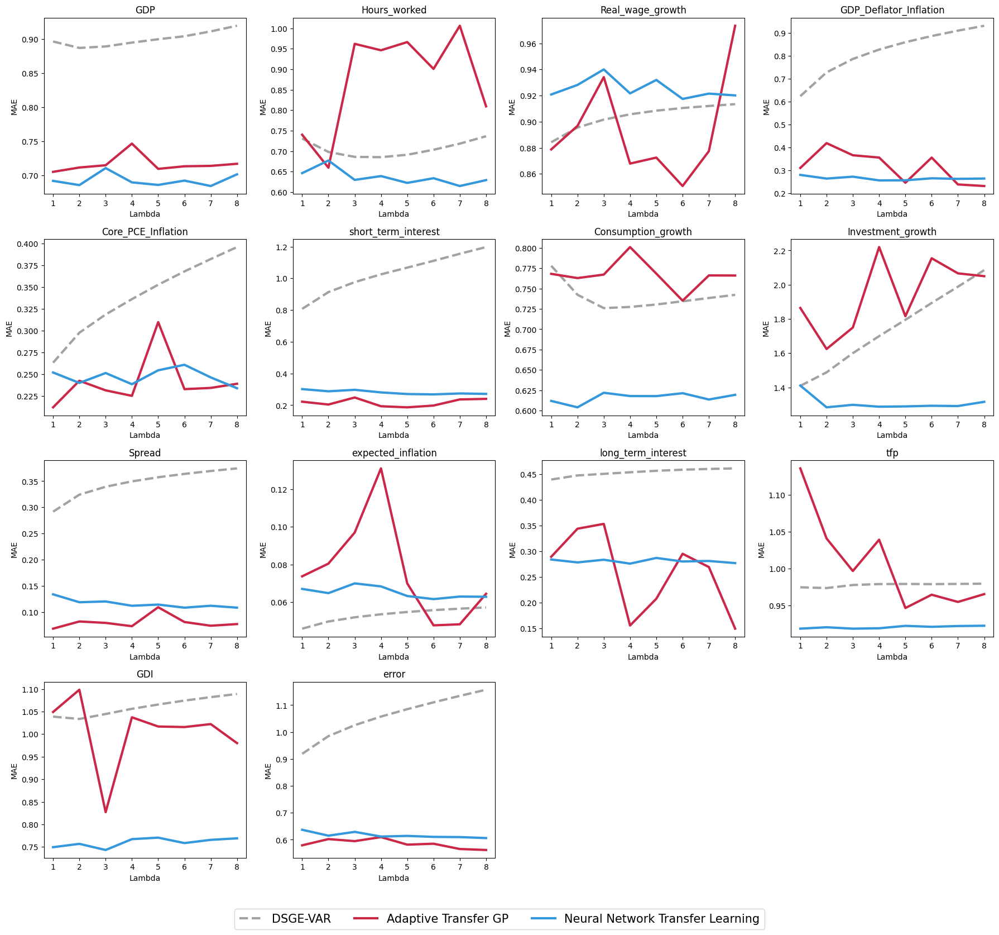

In [24]:
"""
Compare forecast performance across lambda for three models:
    - DSGE-VAR baseline          (VAR_prior)
    - Adaptive Transfer GP       (mae_result)
    - Neural Network Transfer    (save)

For each macro variable (13 variables) and the aggregated 'error',
we plot MAE as a function of lambda in a grid of subplots and
export the figure as an SVG file.
"""

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# ------------------------------------------------------------------------------
# 0. Basic settings (make this cell self-contained)
# ------------------------------------------------------------------------------

RAW_DATA_PATH = "13个变量的targetdata.csv"
DSGE_VAR_PATH = "dsgevar.csv"              
ATGP_PATH = "1225_mae_ATGP_13变量.csv"
MLP_PATH = "mlp_tl_1226.csv"

lags = 3           # lag order used in your models
window_size = 80   # rolling window length used before

df = pd.read_csv(RAW_DATA_PATH)
columns = df.columns.drop("date")

# ------------------------------------------------------------------------------
# 1. Load model performance results
# ------------------------------------------------------------------------------

# DSGE-VAR baseline results
lambda_values = np.arange(1, 9)  # λ = 1, 2, ..., 8

# DSGE-VAR baseline results：只保留 lambda = 1,...,8 这 8 行
VAR_prior_full = pd.read_csv(DSGE_VAR_PATH, index_col="lambda")
VAR_prior = VAR_prior_full.loc[lambda_values]   # 现在每列长度就是 8 了

# ATGP (Adaptive Transfer GP) results
mae_result = pd.read_csv(ATGP_PATH)

# Neural network transfer learning results
save = pd.read_csv(MLP_PATH)

# Lambda grid used in the comparison
lambda_values = np.arange(1, 9)  # λ = 1, 2, ..., 8

# Standardize ATGP errors to be comparable across variables
# (same idea as for VAR_prior / MLP results)
std_y = df.iloc[window_size + 2 * lags:][columns].std().values
mae_result["error"] = (mae_result[columns] / std_y).mean(axis=1)

# ------------------------------------------------------------------------------
# 2. Prepare subplot layout
# ------------------------------------------------------------------------------

# We have 13 individual variables + 1 aggregated 'error'
plot_variables = list(columns) + ["error"]
num_plots = len(plot_variables)       # 14
plots_per_row = 4
num_rows = int(np.ceil(num_plots / plots_per_row))

fig, axs = plt.subplots(num_rows, plots_per_row, figsize=(18, 4 * num_rows))
axs = axs.flatten()  # flatten to make indexing easier

# ------------------------------------------------------------------------------
# 3. Plot MAE vs lambda for each variable
# ------------------------------------------------------------------------------

for idx, var_name in enumerate(plot_variables):
    ax = axs[idx]

    # DSGE-VAR baseline
    ax.plot(
        lambda_values,
        VAR_prior[var_name],
        color="#A2A2A2",
        linestyle="dashed",
        linewidth=3,
        label="DSGE-VAR"
    )

    # Adaptive Transfer GP
    ax.plot(
        lambda_values,
        mae_result[var_name],
        color="#CB2849",
        linewidth=3,
        label="Adaptive Transfer GP"
    )

    # Neural Network Transfer Learning
    ax.plot(
        lambda_values,
        save[var_name],
        color="#3498db",
        linewidth=3,
        label="Neural Network Transfer Learning"
    )

    ax.set_xlabel("Lambda")
    ax.set_ylabel("MAE")
    ax.set_title(var_name)

# Hide any unused subplots (if num_plots is not a multiple of plots_per_row)
for j in range(num_plots, len(axs)):
    fig.delaxes(axs[j])

# ------------------------------------------------------------------------------
# 4. Global layout and legend
# ------------------------------------------------------------------------------

plt.tight_layout()

# Use handles/labels from the first axis for the shared legend
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(
    handles,
    labels,
    loc="lower center",
    ncol=3,
    bbox_to_anchor=(0.5, -0.05),
    fontsize=15
)

# ------------------------------------------------------------------------------
# 5. Save figure
# ------------------------------------------------------------------------------

plt.savefig("./MAE图/3滞后_DNN滚动_80窗口.svg", format="svg", bbox_inches="tight")
plt.show()

